<h1>Differential expreesion between spermatogonia and spermatocytes</h1>

Make a list of transcription factors that are differential expresseed between spermatogonia and spermatocytes.

<b>findMarkers</b> This function provides a convenience wrapper for marker gene identification between groups of cells, based on running pairwiseTTests or related functions and passing the result to combineMarkers. We use the <b>pairwiseTTests</b> option. 



In [1]:
library(scran)
library(scater)
library(bluster)

Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    

In [2]:
load("data/ernst/spermatogenesisAllCellsErnstTF.Rdata")
sce_TF

class: SingleCellExperiment 
dim: 1505 18345 
metadata(0):
assays(2): counts logcounts
rownames(1505): ENSMUSG00000025902 ENSMUSG00000033740 ...
  ENSMUSG00000006270 ENSMUSG00000043969
rowData names(6): ID Symbol ... ontologyTerm UNIPROT
colnames(18345): S9 - 1 S10 - 2 ... S4 - 53509 S11 - 53510
colData names(20): Sample Barcode ... kmeans_order cellType1
reducedDimNames(3): PCA UMAP TSNE
mainExpName: NULL
altExpNames(0):

<h3>Filter spermatogonia and spermatocytes</h3>

In [3]:
sce_SpermatogoniaSpermatocyte = sce_TF[,sce_TF$cellType1 == "Spermatogonia" | sce_TF$cellType1 == "Spermatocytes"]
sce_SpermatogoniaSpermatocyte$cellType1 <- droplevels(sce_SpermatogoniaSpermatocyte$cellType1)
table(sce_SpermatogoniaSpermatocyte$cellType1)


Spermatogonia Spermatocytes 
         1852          8596 

<h3> Find transcription factors that have statistical significant difference expression </h3>

In [4]:
markers <- findMarkers(sce_SpermatogoniaSpermatocyte, sce_SpermatogoniaSpermatocyte$cellType1,test.type="t")
marker.set <- markers[["Spermatogonia"]]
marker.set <- as.data.frame(marker.set)


In [5]:
# topGenes of cluster Spermatogonia
genes <- read.delim("data/ernst/genes.tsv", header = TRUE, sep = "\t", dec = ".")
row.names(genes) <- genes$ID
topGenes <- merge(marker.set, genes , by='row.names')
#head(topGenes,10)
UpGenes <- head(topGenes[order(-topGenes["summary.logFC"]),],10)
DownGenes <- head(topGenes[order(topGenes["summary.logFC"]),],10)
top.markers <- rbind(UpGenes, DownGenes)
#top.markers <- top.markers$Symbol
top.markers


Warning message in xtfrm.data.frame(x):
“cannot xtfrm data frames”
Warning message in xtfrm.data.frame(x):
“cannot xtfrm data frames”


,Row.names,Top,p.value,FDR,summary.logFC,logFC.Spermatocytes,ID,Symbol
,<I<chr>>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1258,ENSMUSG00000066551,28,0,0,2.428129,2.428129,ENSMUSG00000066551,Hmgb1
1314,ENSMUSG00000071076,43,0,0,2.380133,2.380133,ENSMUSG00000071076,Jund
578,ENSMUSG00000031431,41,0,0,2.203809,2.203809,ENSMUSG00000031431,Tsc22d3
506,ENSMUSG00000029177,60,0,0,2.194883,2.194883,ENSMUSG00000029177,Cenpa
151,ENSMUSG00000015217,48,0,0,2.075976,2.075976,ENSMUSG00000015217,Hmgb3
1185,ENSMUSG00000059625,67,0,0,1.922132,1.922132,ENSMUSG00000059625,Sohlh1
357,ENSMUSG00000024837,59,0,0,1.756046,1.756046,ENSMUSG00000024837,Dmrt1
1386,ENSMUSG00000076431,77,0,0,1.704454,1.704454,ENSMUSG00000076431,Sox4
239,ENSMUSG00000020923,83,0,0,1.356373,1.356373,ENSMUSG00000020923,Ubtf


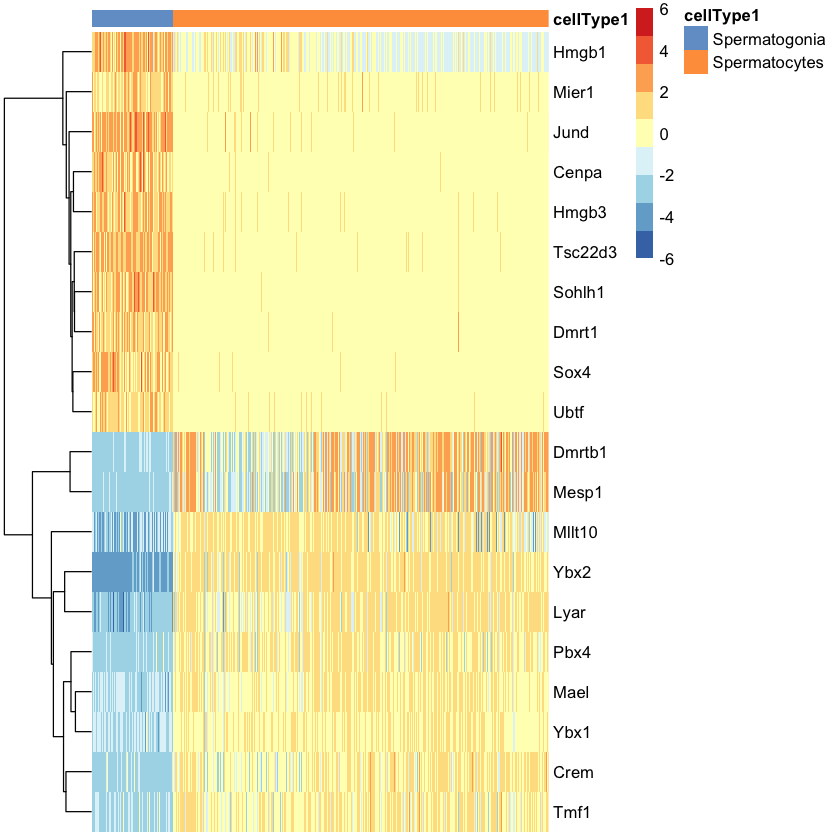

In [6]:
#check expression of top 10 upregulated and downregulated genes

plotHeatmap(sce_SpermatogoniaSpermatocyte, features=top.markers$Symbol, columns=order(sce_SpermatogoniaSpermatocyte$cellType1), 
    colour_columns_by=c("cellType1"),
    cluster_cols=FALSE, center=TRUE,  
    swap_rownames= "Symbol",
    show_colnames = FALSE) 

<h3>Establish a cut off of fold change and p-values. </h3>

Loading required package: ggrepel

Registered S3 methods overwritten by 'ggalt':
  method                  from   
  grid.draw.absoluteGrob  ggplot2
  grobHeight.absoluteGrob ggplot2
  grobWidth.absoluteGrob  ggplot2
  grobX.absoluteGrob      ggplot2
  grobY.absoluteGrob      ggplot2

Warning message:
“One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value...”
Warning message:
“Ignoring unknown parameters: xlim, ylim”


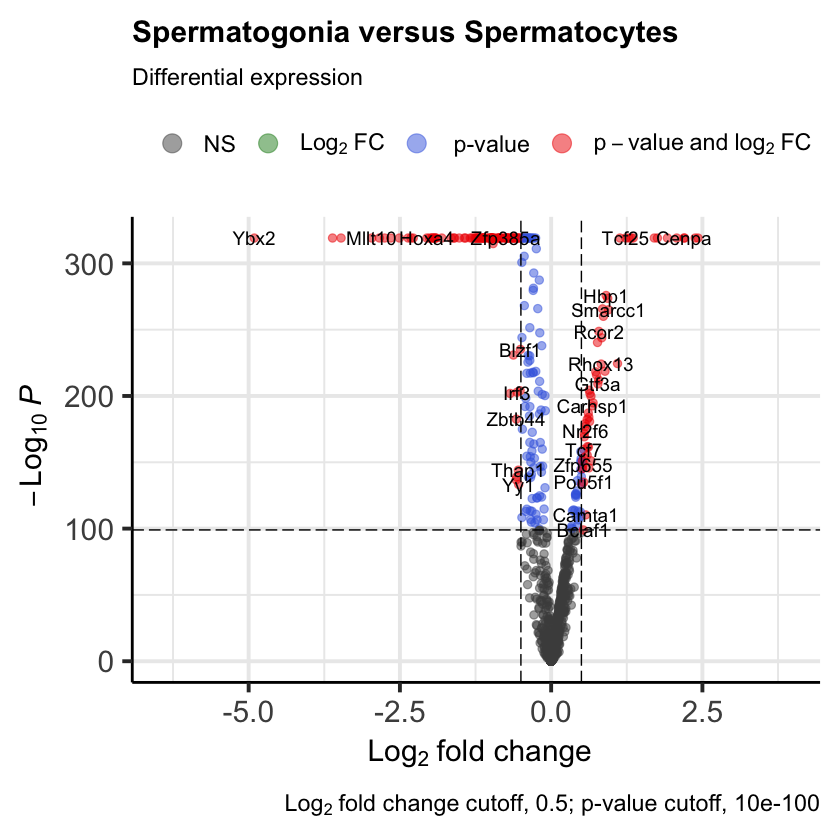

In [7]:
library(EnhancedVolcano)
EnhancedVolcano(topGenes,
                lab = topGenes$Symbol,
                x = 'logFC.Spermatocytes',
                y = 'p.value',
                ylim = 0,
                title = 'Spermatogonia versus Spermatocytes',
                pCutoff = 10e-100,
                FCcutoff = 0.5,
                pointSize = 2.0,
                labSize = 4.0,
                caption = bquote(~Log[2]~ "fold change cutoff, 0.5; p-value cutoff, 10e-100"),
                subtitle = "Differential expression")

<h3>Creat a list of genes based on the cutoff</h3>

In [8]:
topGenes <-topGenes[order(topGenes$logFC.Spermatocytes, decreasing = TRUE),]

cut_topGenes <- topGenes[topGenes$logFC.Spermatocytes > 0.5 | topGenes$logFC.Spermatocytes < -0.5,]
cut_topGenes <- cut_topGenes[cut_topGenes$p.value < 10e-100 ,]
print("Total genes")
dim(topGenes)
print("Cutoff")
dim(cut_topGenes)
write.csv(cut_topGenes,"data/ernst/TFdif_spermatogonia_spermatocytes.csv", row.names = FALSE)

[1] "Total genes"


[1] 1505    8

[1] "Cutoff"


[1] 148   8

In [9]:
head(cut_topGenes) 

,Row.names,Top,p.value,FDR,summary.logFC,logFC.Spermatocytes,ID,Symbol
,<I<chr>>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1258,ENSMUSG00000066551,28,0,0,2.428129,2.428129,ENSMUSG00000066551,Hmgb1
1314,ENSMUSG00000071076,43,0,0,2.380133,2.380133,ENSMUSG00000071076,Jund
578,ENSMUSG00000031431,41,0,0,2.203809,2.203809,ENSMUSG00000031431,Tsc22d3
506,ENSMUSG00000029177,60,0,0,2.194883,2.194883,ENSMUSG00000029177,Cenpa
151,ENSMUSG00000015217,48,0,0,2.075976,2.075976,ENSMUSG00000015217,Hmgb3
1185,ENSMUSG00000059625,67,0,0,1.922132,1.922132,ENSMUSG00000059625,Sohlh1


In [10]:
proteins = rowData(sce_TF)[ rowData(sce_TF)[,"Symbol"] %in% cut_topGenes$Symbol  ,"UNIPROT"] 
head(proteins)

[1] "E9QLX9"     "D3YU81"     "Q99JB0"     "A0A0J9YU08" "Q3V485"    
[6] "Q8BVN9"

In [11]:
#Gene ontology of protein list using UNIPROT
library(UniprotR)
GeneOntologyObj <- GetProteinGOInfo(proteins) 

Please wait we are processing your accessions ...


[>----------------------------------------------------------------------]   1%

[>----------------------------------------------------------------------]   2%

[=>---------------------------------------------------------------------]   3%

[==>--------------------------------------------------------------------]   4%

[==>--------------------------------------------------------------------]   5%

[===>-------------------------------------------------------------------]   5%

[===>-------------------------------------------------------------------]   6%

[====>------------------------------------------------------------------]   7%

[=====>-----------------------------------------------------------------]   8%

[=====>-----------------------------------------------------------------]   9%

[======>----------------------------------------------------------------]   9%

[======>------------------------------------------------------------

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



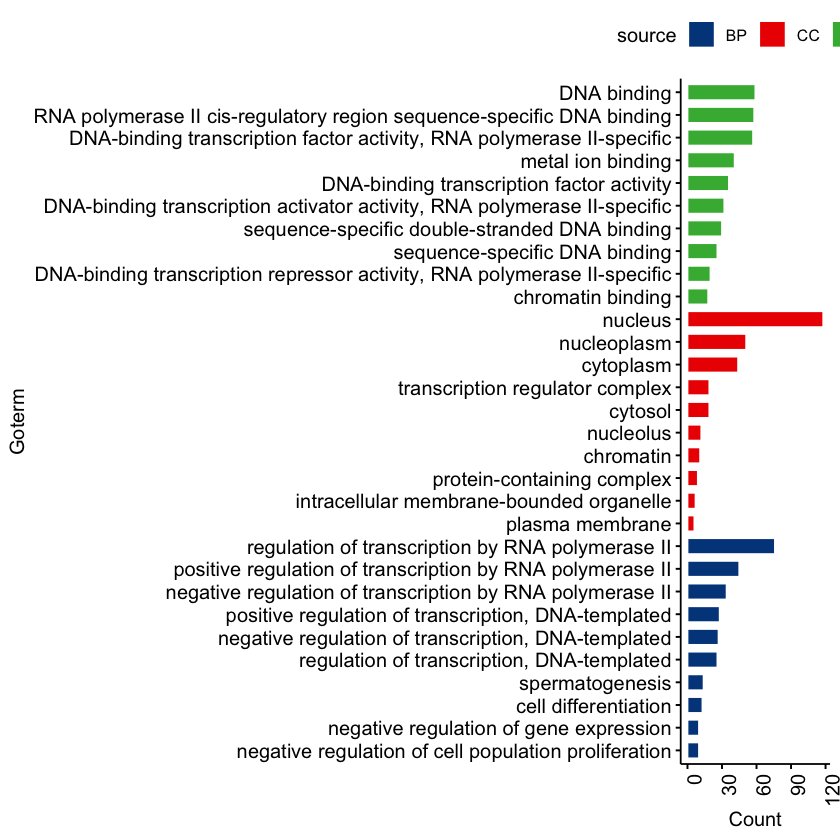

In [12]:
PlotGOAll(GOObj = GeneOntologyObj, Top = 10, directorypath = getwd(), width = 8, height = 5)

 bp Biological Process, cc Cellular Component, green is  Molecular Function

<h3>Visualize top 10 marker genes in the TSNE graph.</h3>

In [13]:
#Enrich the data using a protein data base UNIPROT

proteins = rowData(sce_TF)[ rowData(sce_TF)[,"Symbol"] %in% top.markers$Symbol  ,"UNIPROT"] 
proteins
PathologyObj <- GetPathology_Biotech(proteins )

[1] "Q8BVN9"     "O54826"     "Q6IUP1"     "O54879"     "Q9Z2S7"    
 [6] "Q32P49"     "A2A9I7"     "P62960"     "O35216"     "Q08288"    
[11] "P63158"     "B9EKI3"     "P97309"     "Q99NE9"     "P15066"    
[16] "A0A0A0MQD2" "A2AWT6"     "Q06831"     "P27699"     "Q9QZ59"

Please wait we are processing your accessions ...


[======>----------------------------------------------------------------]  10%

[==========>------------------------------------------------------------]  15%

[=============>---------------------------------------------------------]  20%

[=================>-----------------------------------------------------]  25%

[====================>--------------------------------------------------]  30%

[========================>----------------------------------------------]  35%

[===========================>-------------------------------------------]  40%

[===============================>---------------------------------------]  45%

[===================================>-----------------------------------]  50%

[======================================>--------------------------------]  55%

[==========================================>----------------------------]  60%

[=============================================>---------------------

In [14]:
head(PathologyObj)

,Allergenic.properties,Biotechnological.use,Disruption.phenotype,Involvement.in.disease,Pharmaceutical.use,Toxic.dose
,<lgl>,<lgl>,<chr>,<lgl>,<lgl>,<lgl>
Q8BVN9,NA,NA,"DISRUPTION PHENOTYPE: Mice are viable but show profound defect in synapsis of homologous chromosomes in male meiosis, piRNA production defects, DNA demethylation of LINE-1 (L1) transposable elements and a 100-fold increase in L1 expression in the adult testis. In the adult testes, L1 transposon derepression occurs at the onset of meiosis. As a result, spermatocytes are flooded with L1 ribonucleoproteins (RNPs) that accumulates in large cytoplasmic enclaves and nuclei. Spermatocytes with nuclear L1 RNPs exhibit massive DNA damage and severe chromosome asynapsis. In gonocytes, PIWIL4, TDRD9, and DDX4 are lost from piP-bodies, whereas no effects on pi-body composition are observed. {ECO:0000269|PubMed:18694567, ECO:0000269|PubMed:20011505}.",NA,NA,NA
O54826,NA,NA,NA,NA,NA,NA
Q6IUP1,NA,NA,"DISRUPTION PHENOTYPE: Knockout mice are infertile. Males lacking SOHLH1 display disrupted spermatogonial differentiation into spermatocytes and show a strong down-regulation Lhx8 and Neurog3/Ngn3 genes (PubMed:16564520). Females display perturbed follicular formation, probably partially due to down-regulation of Nobox and Figla, 2 genes required for folliculogenesis (PubMed:16690745). Fertility could be restored by conditional expression of a SOHLH1 transgene after the onset of meiosis (PubMed:28504655). {ECO:0000269|PubMed:16564520, ECO:0000269|PubMed:16690745, ECO:0000269|PubMed:28504655}.",NA,NA,NA
O54879,NA,NA,NA,NA,NA,NA
Q9Z2S7,NA,NA,NA,NA,NA,NA
Q32P49,NA,NA,NA,NA,NA,NA


[1] "Hmgb1   ENSMUSG00000066551   high mobility group box 1"
[1] "open form four-way junction DNA binding"
[1] "DISRUPTION PHENOTYPE: Rapid death within 24 h following birth due to hypoglycaemia. {ECO:0000269|PubMed:10391216}."


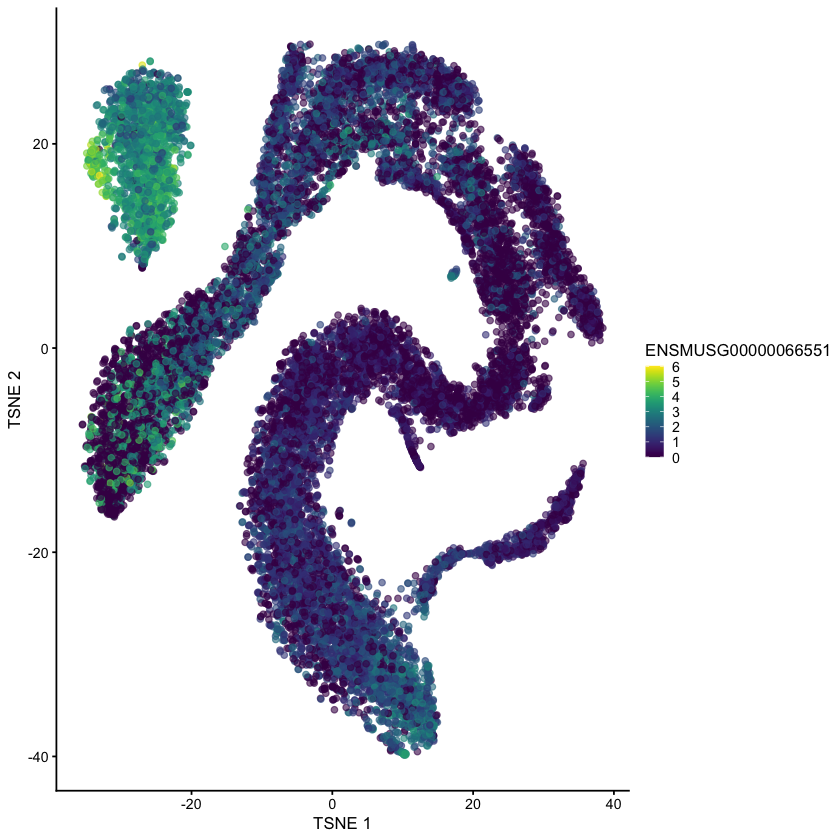

[1] "Jund   ENSMUSG00000071076   jun D proto-oncogene"
[1] "transcription regulatory region sequence-specific DNA binding"


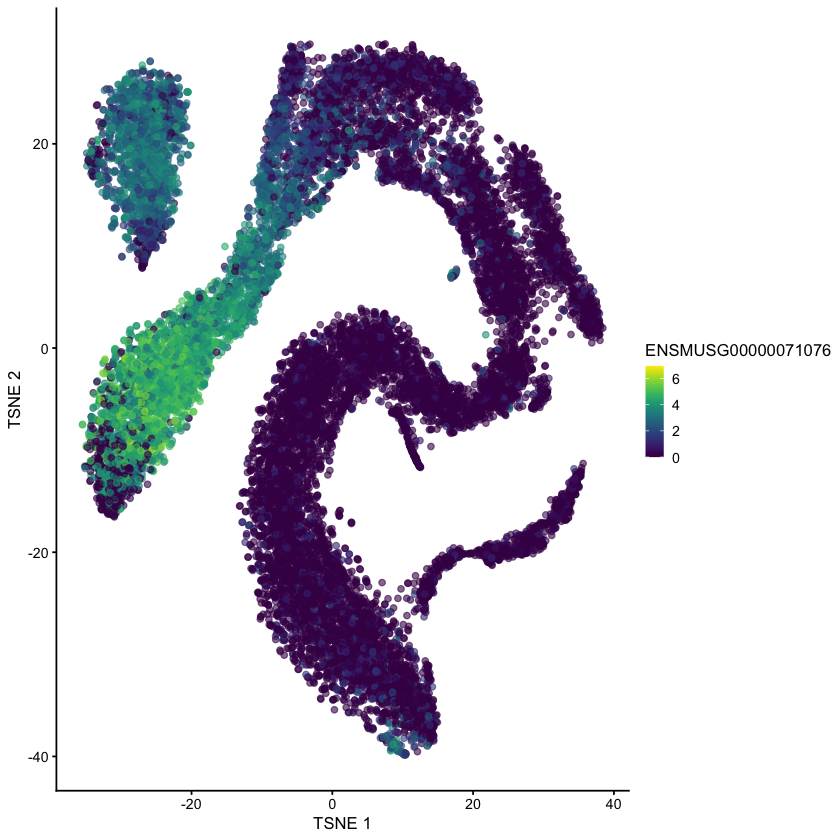

[1] "Tsc22d3   ENSMUSG00000031431   TSC22 domain family, member 3"
[1] "negative regulation of transcription by RNA polymerase II"


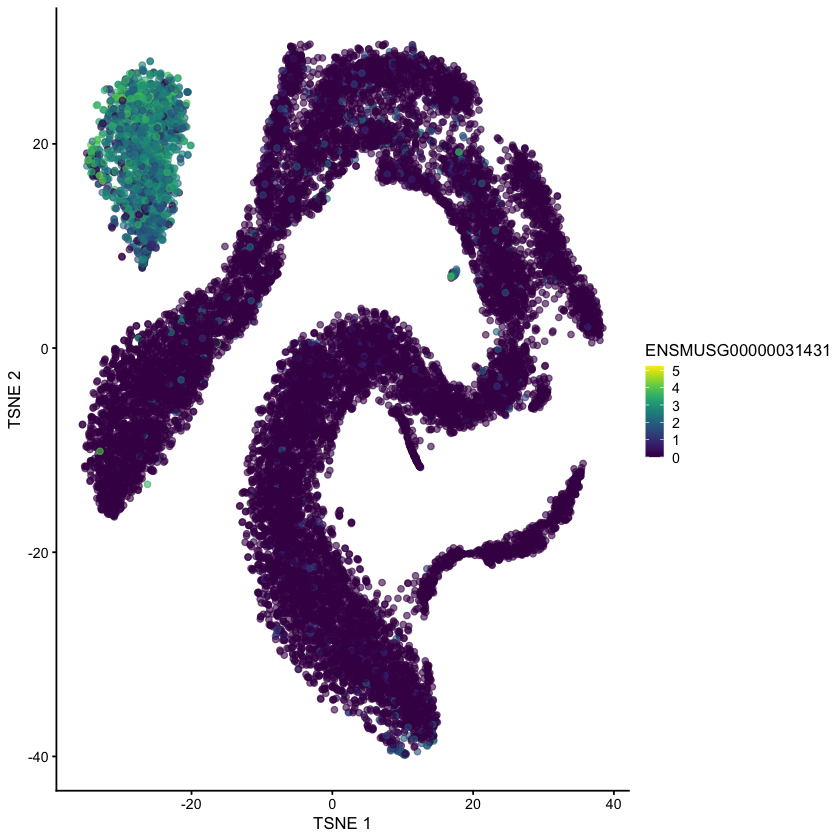

[1] "Cenpa   ENSMUSG00000029177   centromere protein A"
[1] "establishment of mitotic spindle orientation"


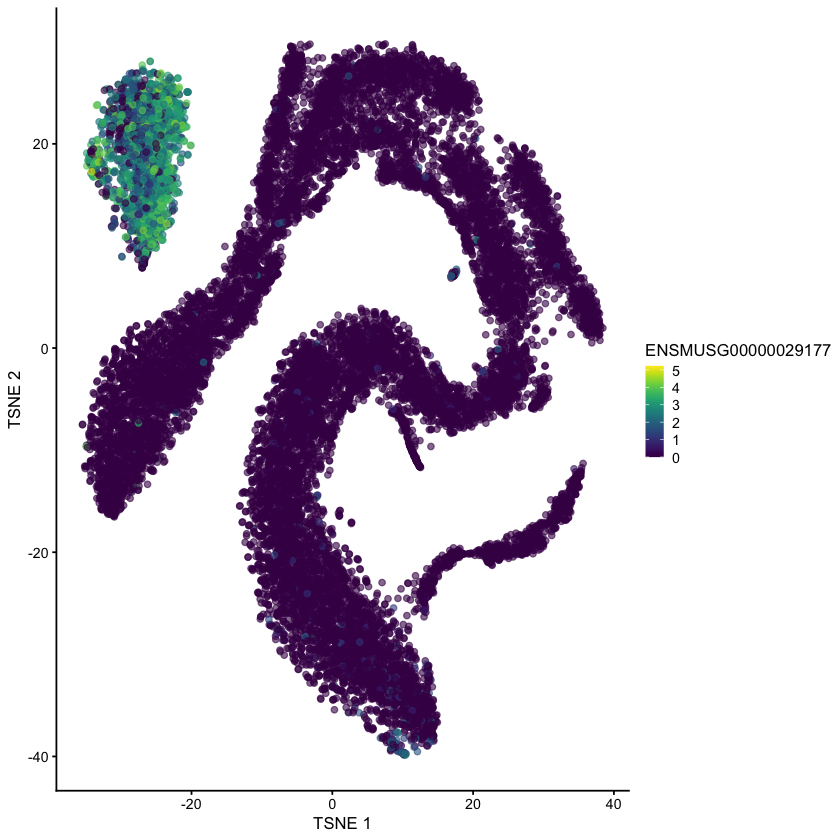

[1] "Hmgb3   ENSMUSG00000015217   high mobility group box 3"
[1] "immune system process"


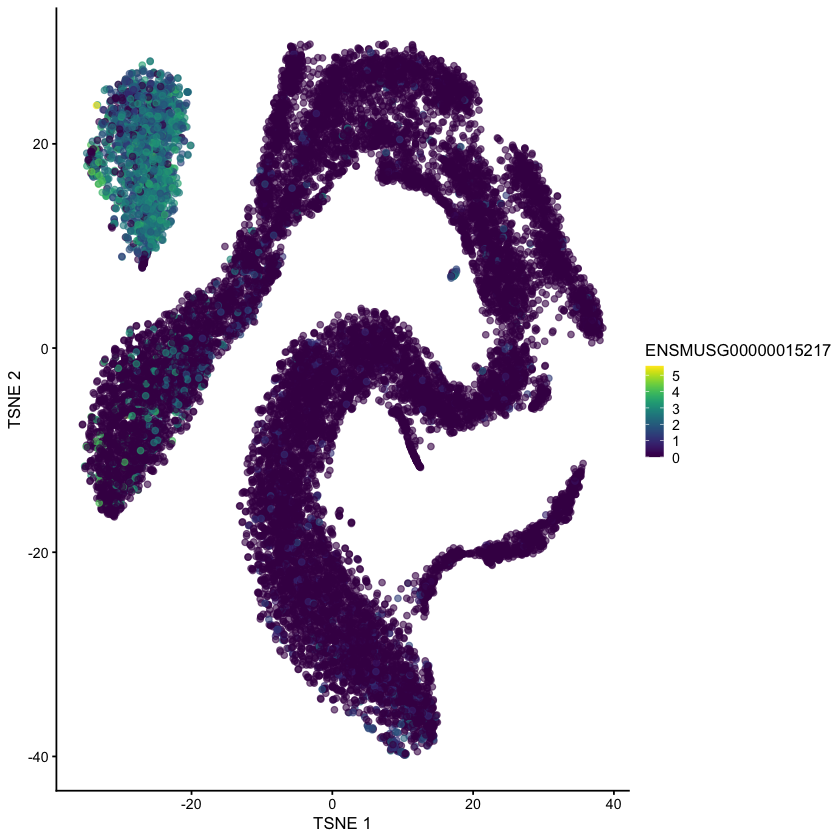

[1] "Sohlh1   ENSMUSG00000059625   spermatogenesis and oogenesis specific basic helix-loop-helix 1"
[1] "RNA polymerase II transcription regulatory region sequence-specific DNA binding"
[1] "DISRUPTION PHENOTYPE: Knockout mice are infertile. Males lacking SOHLH1 display disrupted spermatogonial differentiation into spermatocytes and show a strong down-regulation Lhx8 and Neurog3/Ngn3 genes (PubMed:16564520). Females display perturbed follicular formation, probably partially due to down-regulation of Nobox and Figla, 2 genes required for folliculogenesis (PubMed:16690745). Fertility could be restored by conditional expression of a SOHLH1 transgene after the onset of meiosis (PubMed:28504655). {ECO:0000269|PubMed:16564520, ECO:0000269|PubMed:16690745, ECO:0000269|PubMed:28504655}."


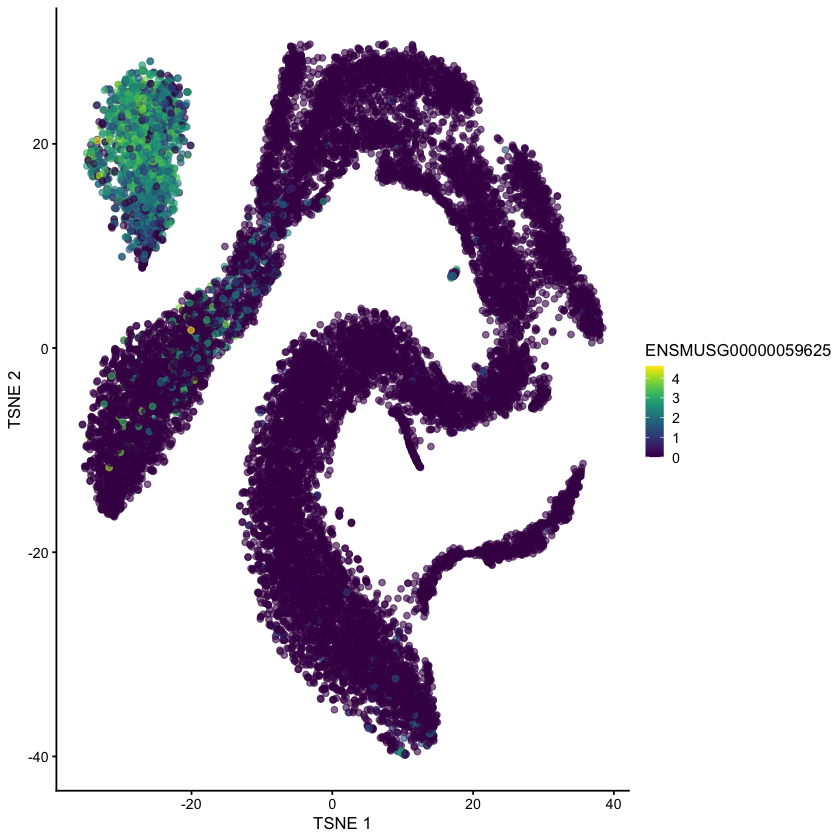

[1] "Dmrt1   ENSMUSG00000024837   doublesex and mab-3 related transcription factor 1"
[1] "negative regulation of transcription by RNA polymerase II"
[1] "DISRUPTION PHENOTYPE: Severe defects in the adult testis with hypoplastic testes and disorganization of seminiferous tubules and absence of germ cells, due to pre-meiotic germ cell death in testes. Sertoli cell fail to differentiate. Female mutant mice have normal ovaries and are fertile. Depending on the strain background mice also show testis teratomas: deletion in 129/Sv strain causes a high incidence of teratomas, whereas these tumors do not form in C57BL/6J mutant mice. Deletion of Dmrt1 during fetal development causes postnatal Sertoli cells to lose male-promoting Sox9 and instead activation of female-promoting genes such as Foxl2, leading to reprogrammation of Sertoli cells into granulosa cells. As a consequence, theca cells form, estrogen is produced and germ cells appear feminized. {ECO:0000269|PubMed:11040213, ECO:0000269|P

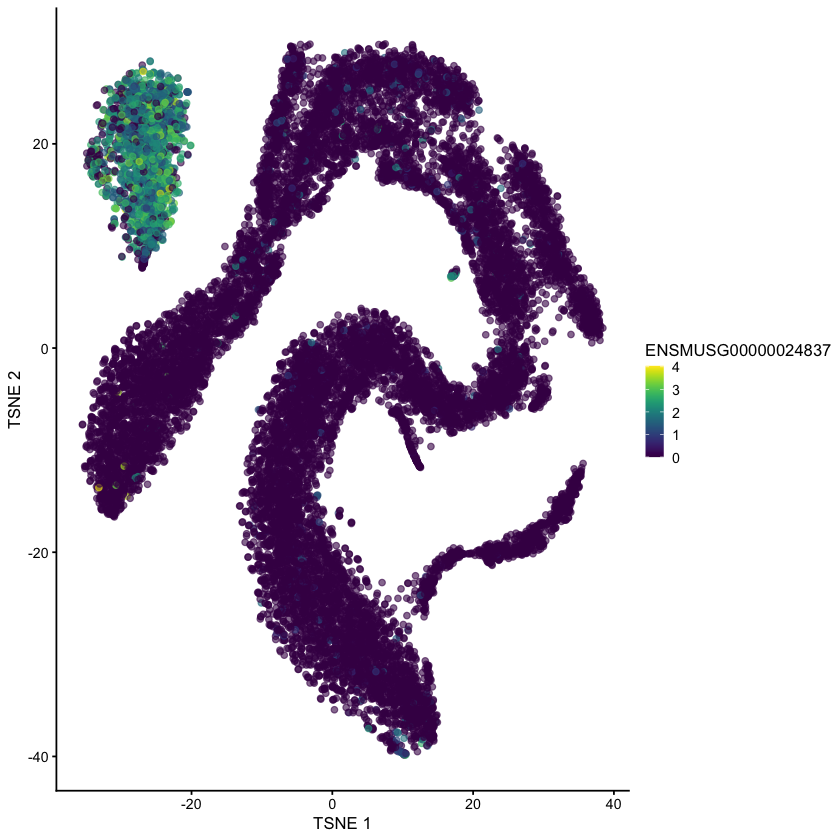

[1] "Sox4   ENSMUSG00000076431   SRY (sex determining region Y)-box 4"
[1] "transcription regulatory region sequence-specific DNA binding"
[1] "DISRUPTION PHENOTYPE: In T-cell-specific knockout mice, loss of mature Il17a-producing Vgamma2-positive gamma-delta T-cells and reduction of Rorc expression in immature Vgamma2-positive thymocytes (PubMed:23562159). In a mouse model for psoriasis, dermal inflammation induced by skin application of TLR7 synthetic ligand imiquimod is substantially reduced due to the absence of Vgamma2-positive gamma-delta T-cells (PubMed:23562159). {ECO:0000269|PubMed:23562159}."


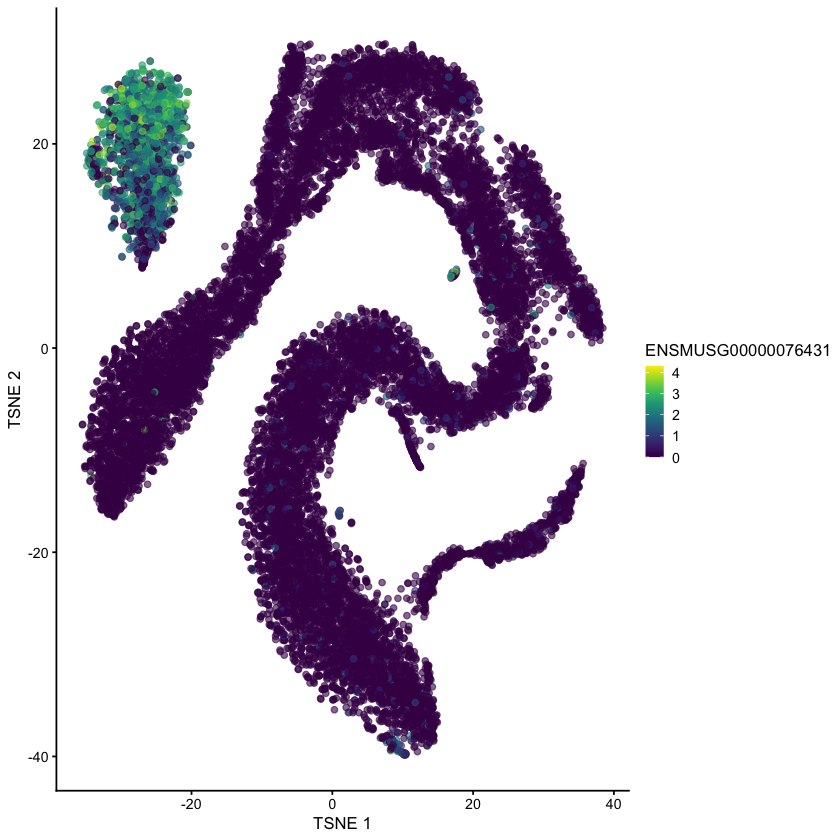

[1] "Ubtf   ENSMUSG00000020923   upstream binding transcription factor, RNA polymerase I"
[1] "rDNA heterochromatin assembly"


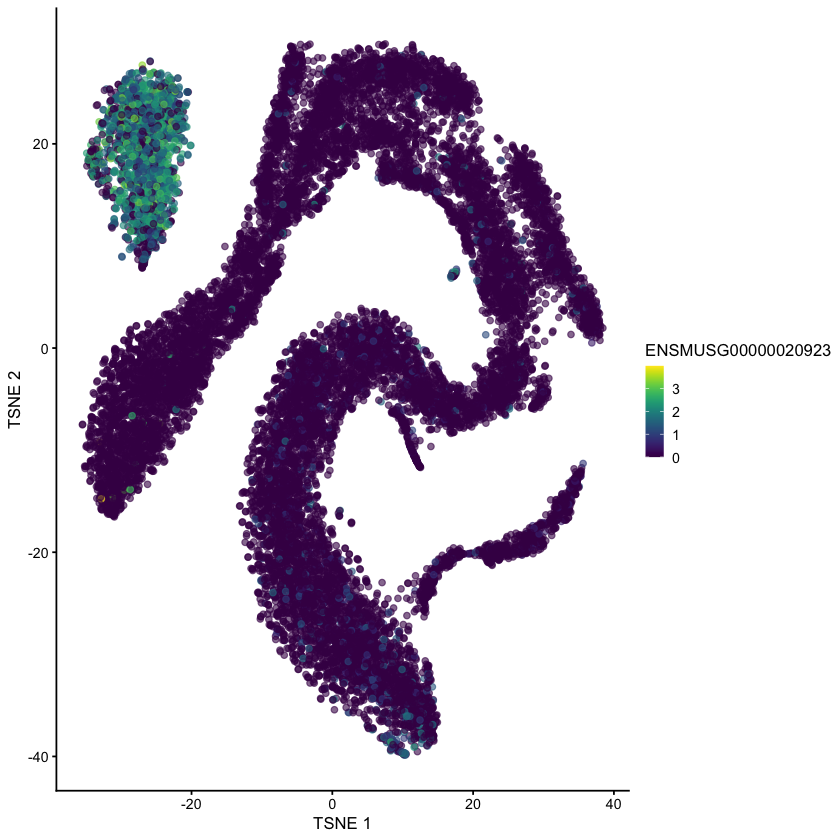

[1] "Mier1   ENSMUSG00000028522   MEIR1 treanscription regulator"
[1] "negative regulation of transcription by RNA polymerase II"


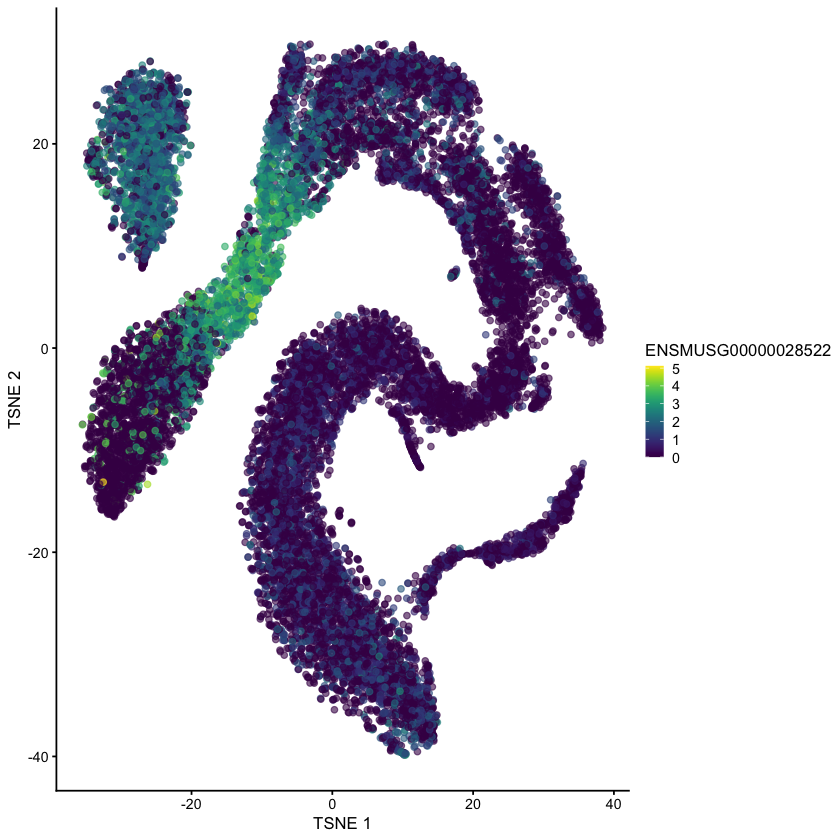

[1] "Ybx2   ENSMUSG00000018554   Y box protein 2"
[1] "nucleic acid binding"


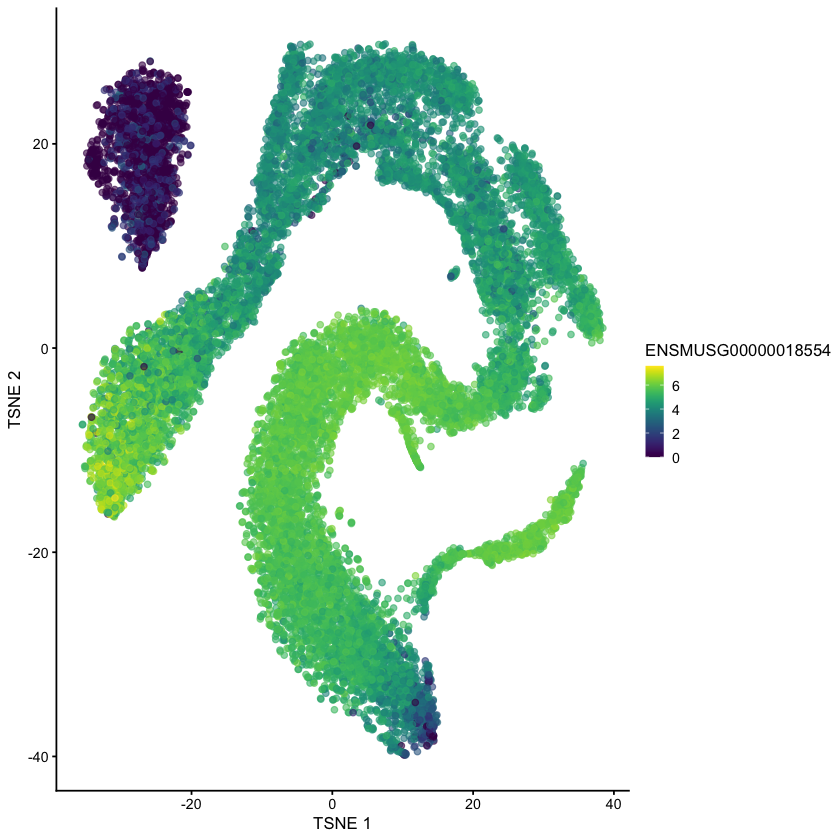

[1] "Lyar   ENSMUSG00000067367   Ly1 antibody reactive clone"
[1] "negative regulation of transcription by RNA polymerase II"
[1] "DISRUPTION PHENOTYPE: No visible phenotype. Mutant mice are fully fertile and show intact spermatogenesis. {ECO:0000269|PubMed:23212345}."


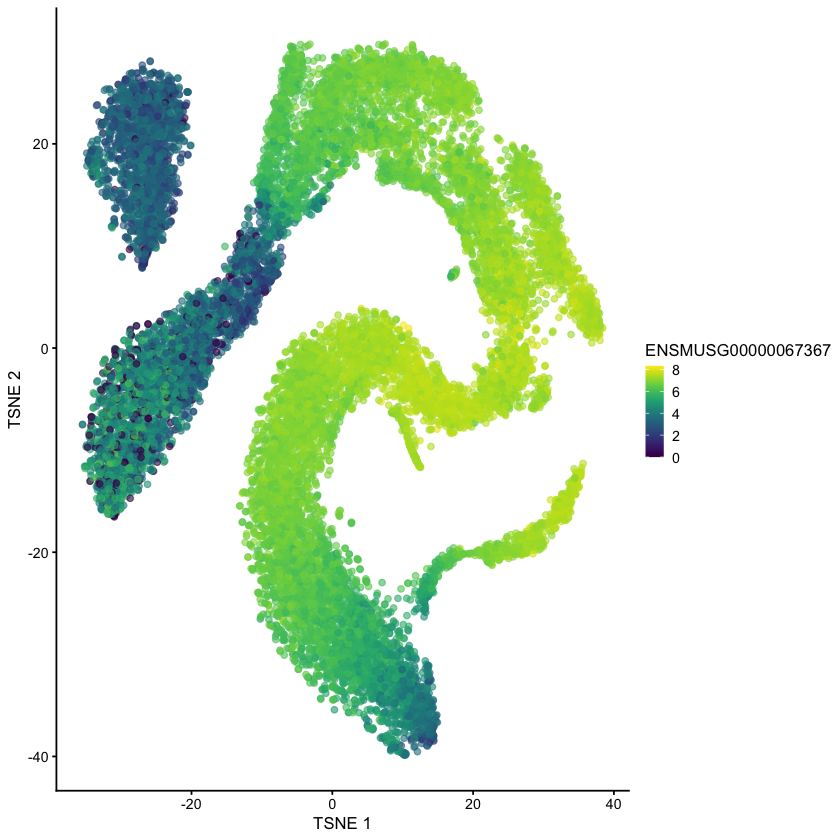

[1] "Dmrtb1   ENSMUSG00000028610   DMRT-like family B with proline-rich C-terminal, 1"
[1] "RNA polymerase II cis-regulatory region sequence-specific DNA binding"


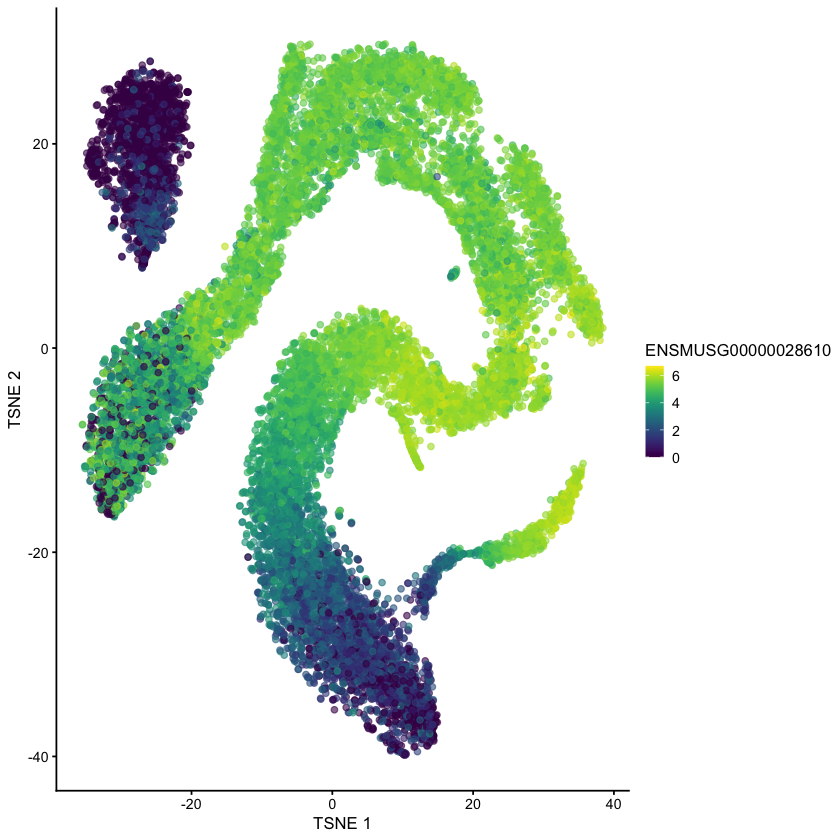

[1] "Mllt10   ENSMUSG00000026743   myeloid/lymphoid or mixed-lineage leukemia; translocated to, 10"
[1] "chromatin binding"


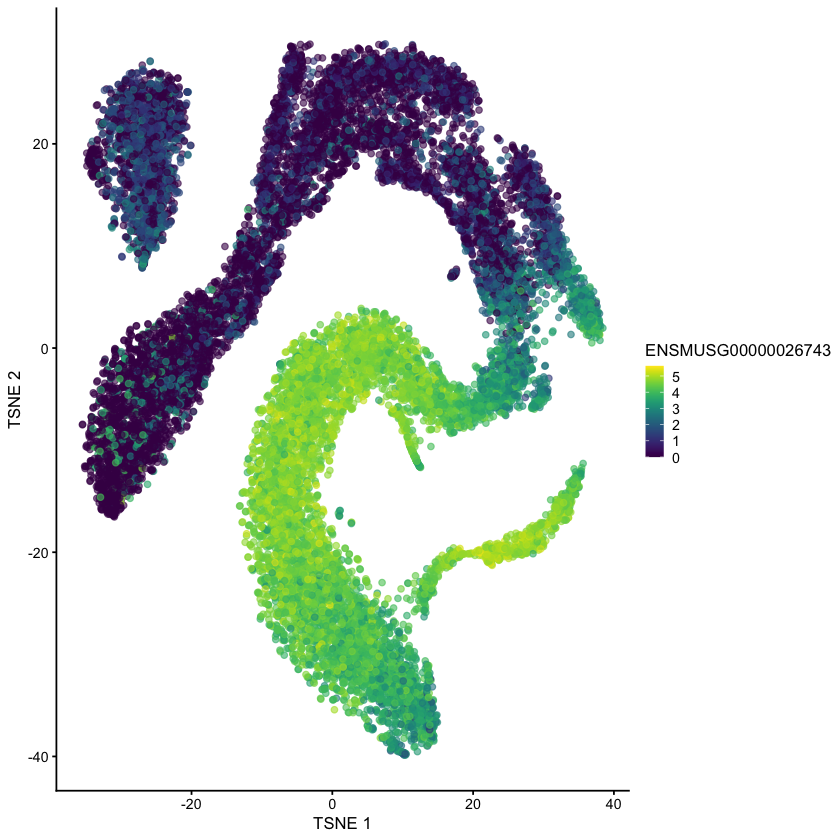

[1] "Mesp1   ENSMUSG00000030544   mesoderm posterior 1"
[1] "transcription regulatory region sequence-specific DNA binding"
[1] "DISRUPTION PHENOTYPE: Mice embryos exhibit defects in single heart tube formation, due to a delay in mesodermal migration. However, the cells eventually acquired migratory activity and gave rise to an abnormal heart tube. Mice lacking Mesp1 and Mesp2 die around 9.5 dpc. The major defect is the apparent lack of any mesodermal layer between endoderm and ectoderm and a defect in the migratory activity of mesodermal cells. It seems that a compensatory mechanism exists in which Mesp1 expression is up-regulated in the absence of Mesp2. Mesp1 may be involved in the rescue of somitogenesis in the null Mesp2 embryos. {ECO:0000269|PubMed:10887078, ECO:0000269|PubMed:15677726, ECO:0000269|PubMed:17306789}."


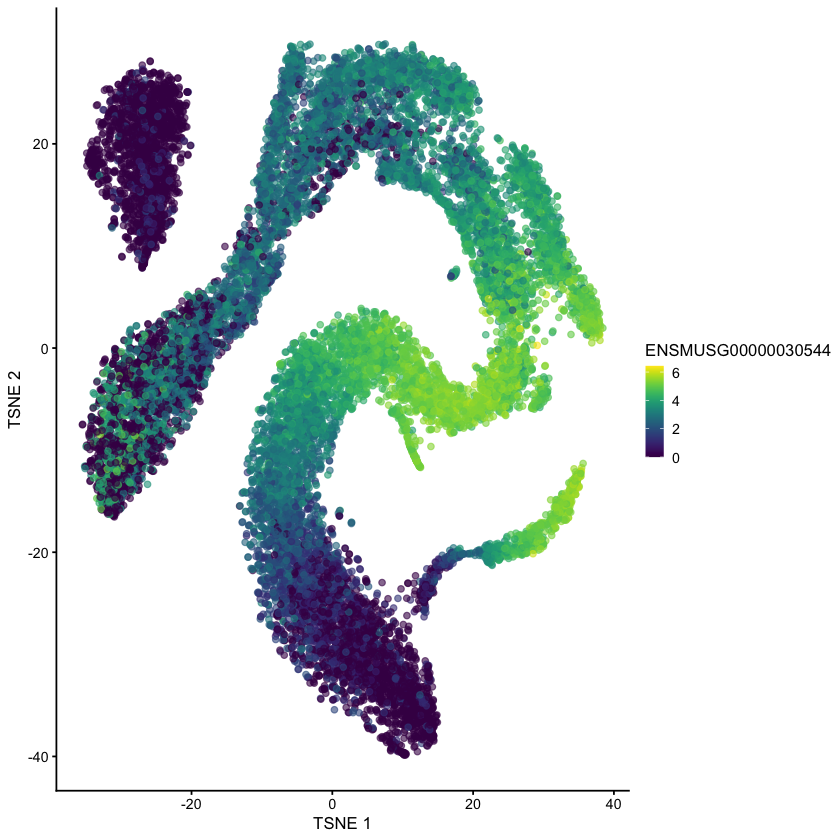

[1] "Pbx4   ENSMUSG00000031860   pre B cell leukemia homeobox 4"
[1] "RNA polymerase II cis-regulatory region sequence-specific DNA binding"


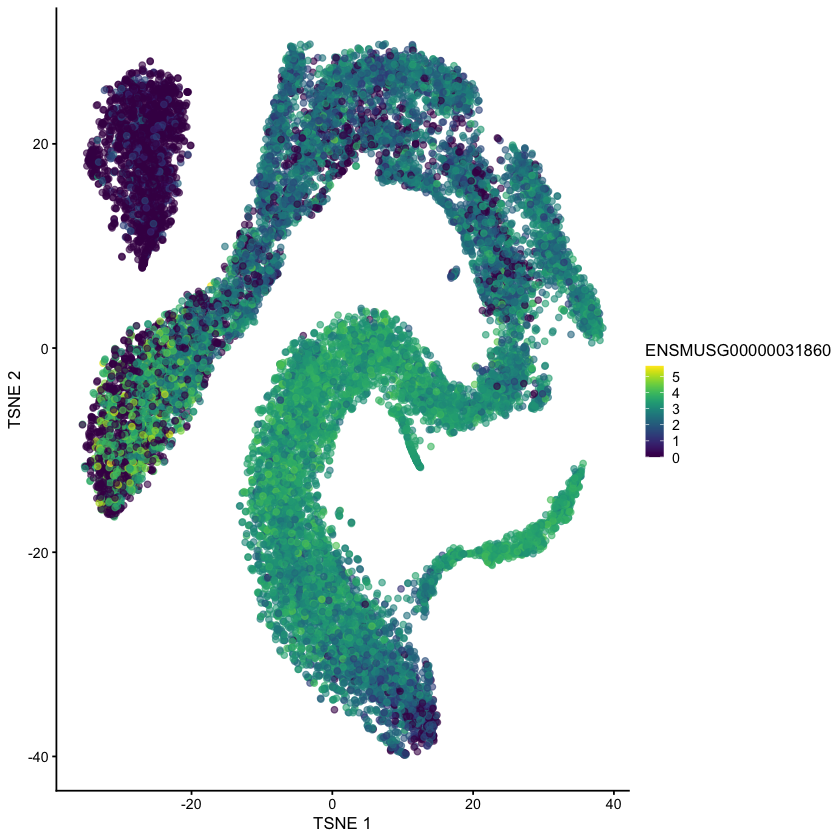

[1] "Mael   ENSMUSG00000040629   maelstrom spermatogenic transposon silencer"
[1] "negative regulation of transcription by RNA polymerase II"
[1] "DISRUPTION PHENOTYPE: Mice are viable but show profound defect in synapsis of homologous chromosomes in male meiosis, piRNA production defects, DNA demethylation of LINE-1 (L1) transposable elements and a 100-fold increase in L1 expression in the adult testis. In the adult testes, L1 transposon derepression occurs at the onset of meiosis. As a result, spermatocytes are flooded with L1 ribonucleoproteins (RNPs) that accumulates in large cytoplasmic enclaves and nuclei. Spermatocytes with nuclear L1 RNPs exhibit massive DNA damage and severe chromosome asynapsis. In gonocytes, PIWIL4, TDRD9, and DDX4 are lost from piP-bodies, whereas no effects on pi-body composition are observed. {ECO:0000269|PubMed:18694567, ECO:0000269|PubMed:20011505}."


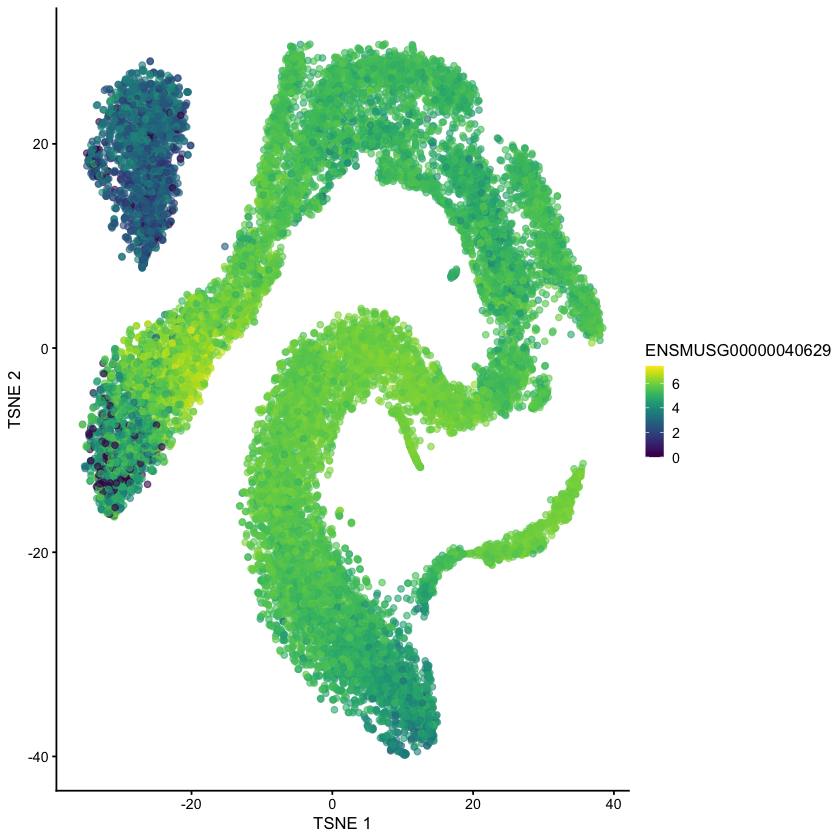

[1] "Ybx1   ENSMUSG00000028639   Y box protein 1"
[1] "negative regulation of transcription by RNA polymerase II"
[1] "DISRUPTION PHENOTYPE: Perinatal lethality (PubMed:15899865). Embryos develop normally up to embryonic day 13.5 (E13.5) and then show progressive mortality (PubMed:15899865). Embryos display severe growth retardation caused by hypoplasia in multiple organs (PubMed:15899865). Fibroblasts show a normal rate of protein synthesis and minimal alterations in the transcriptome and proteome (PubMed:15899865). Mice show defects in the architecture of the skin characterized by markedly reduced thickness of the epidermis and delayed onset of the placodes to hair follicle transition (PubMed:29712925). {ECO:0000269|PubMed:15899865, ECO:0000269|PubMed:29712925}."


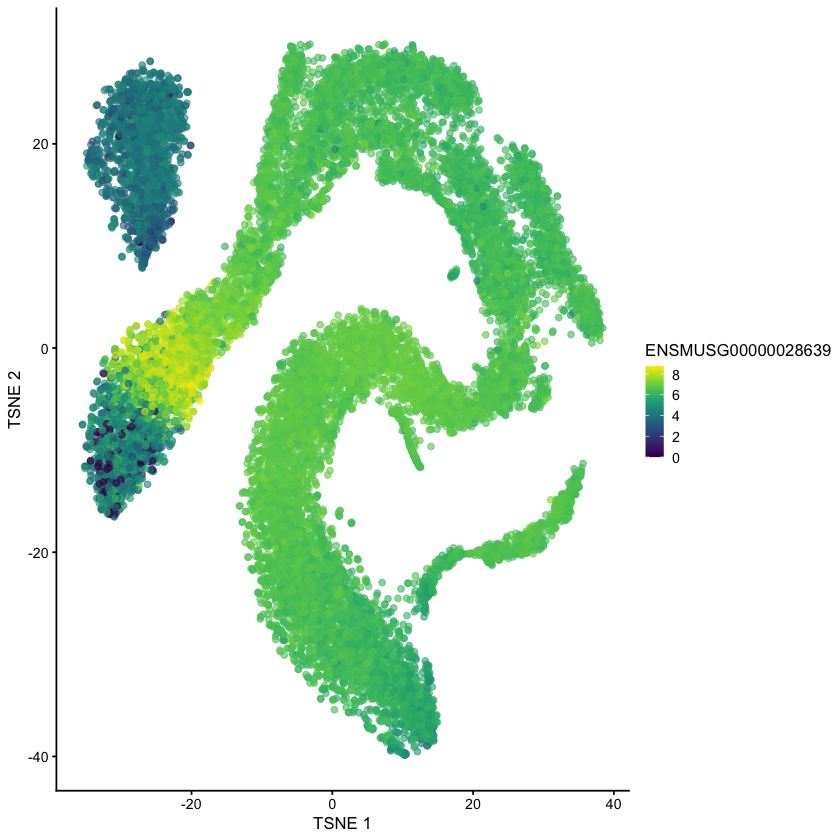

[1] "Crem   ENSMUSG00000063889   cAMP responsive element modulator"
[1] "negative regulation of transcription by RNA polymerase II"


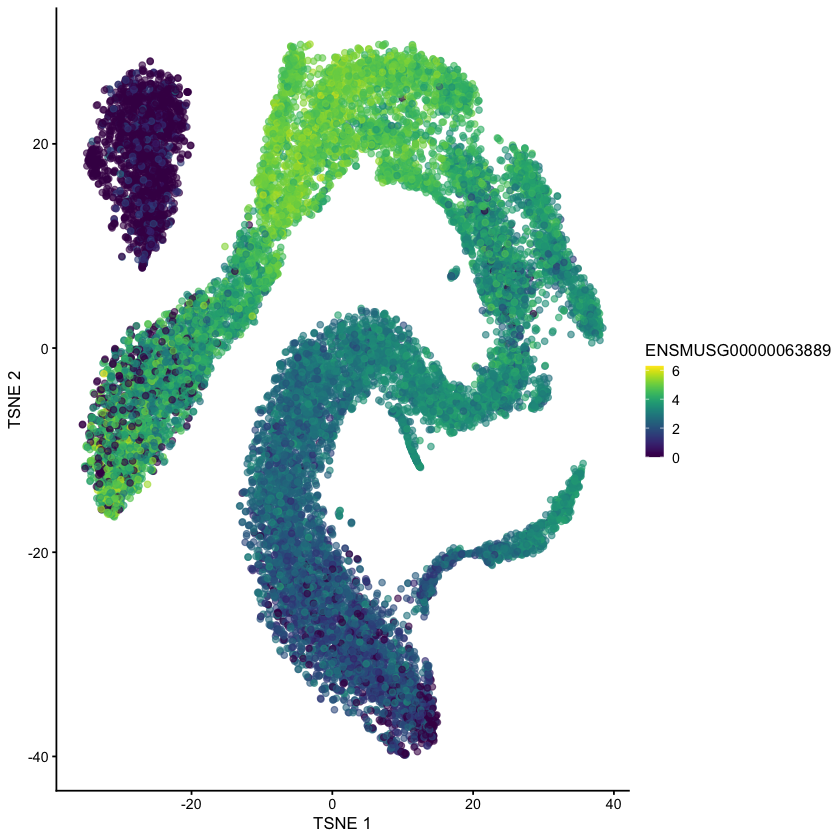

[1] "Tmf1   ENSMUSG00000030059   TATA element modulatory factor 1"
[1] "acrosome assembly"


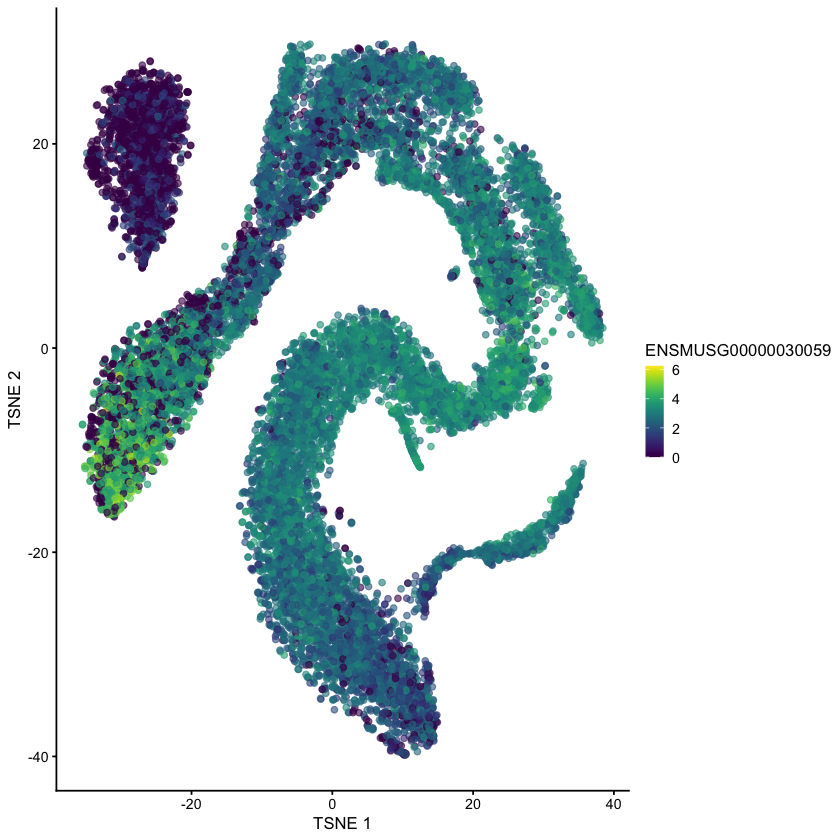

In [15]:
# Add gene expression in the TSNE plot

for (genes_symbol in top.markers$Symbol) {
    gene_id = rowData(sce_TF)[ rowData(sce_TF)[,"Symbol"]== genes_symbol  ,"ID"] 
    name = rowData(sce_TF)[ rowData(sce_TF)[,"Symbol"]== genes_symbol  ,"name"] 
    protein = rowData(sce_TF)[ rowData(sce_TF)[,"Symbol"] == genes_symbol   ,"UNIPROT"] 
    
    Disruption.phenotype = PathologyObj[ protein,"Disruption.phenotype"]
    
    ontologyTerm = rowData(sce_TF)[ rowData(sce_TF)[,"Symbol"]== genes_symbol  ,"ontologyTerm"]
    print(plotTSNE(sce_TF, colour_by=gene_id  ))
    print(paste(genes_symbol," ",gene_id," ",name))
    print(ontologyTerm)
    if(!is.na(Disruption.phenotype))
        print(Disruption.phenotype)
}
#